In [14]:
import time
import os
import sys
import pprint
import numpy as np
import torch
import torchvision.transforms as transforms
import glob
import shutil
import pickle
import argparse
import seaborn as sns
import matplotlib.pyplot as plt
import re
import pandas as pd
sys.path.append(".")
sys.path.append("..")
from pathlib import Path
from utils.common import tensor2im
from utils.domain_adaptation_utils import run_domain_adaptation
from PIL import Image
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA
from twodlda import *
from LDA2D import * 
from PIL import Image, ImageOps
from torchvision.utils import save_image
from sklearn.neighbors import KNeighborsClassifier
from matplotlib import pyplot as plt
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
def get_key_ck(fp):
    filename = os.path.splitext(os.path.basename(fp))[0]
    int_part = filename.split()[0]
    int_part = int_part.split('_')[-1]
    return int(int_part) 


def load_subject(s_id=0,path="/data2/artgan/hyperstyle-old/videos/*/"):
    subject_dir_set = []
    subject_lbldir_set = []
    dirs_img = glob.glob(path)
    dirs_emo = glob.glob( "/data2/nicolas/DB/CK/emotion/*/")

    for d in dirs_img:
        subject_dir_set.append(os.path.dirname(d))

    for d in dirs_emo:
        subject_lbldir_set.append(os.path.dirname(d))

    # Evaluar todas las expresiones para s_id y tomar los neutros
    subject = subject_dir_set[s_id]
    emotion_dirs = glob.glob(subject+"/*")
    X = []

    for d in sorted(emotion_dirs): 
        l = sorted(glob.glob(d+'/img/*.png'),key=get_key_ck)

        X.append(l)

    return X

def load_subject(s_id):
    subject_dir_set = []
    subject_lbldir_set = []
    dirs_img = glob.glob(f'/data2/artgan/hyperstyle-old/results/new/{s_id}/*')
    for d in dirs_img:
        subject_dir_set.append(os.path.dirname(d))

    X = []

    for d in sorted(dirs_img): 
        print(d)
        l = sorted(glob.glob(d+'/*/*.jpg'),key=get_key_ck)
        X.append(l)

    return X

def run_alignment(image_path, output_size):
    import dlib
    from scripts.align_faces_parallel import align_face
    predictor = (dlib.shape_predictor(
        "./predictor/shape_predictor_68_face_landmarks.dat"))
    aligned_image = align_face(image_path, predictor,output_size)
    print(f"Finished running alignment on image: {image_path}")
    return aligned_image

In [107]:
X = load_subject(59)
Y = np.array([5,3,2,1,2,5,5,4])

tr = transforms.Compose([transforms.CenterCrop((180,140)),transforms.Resize((256, 256)),
                         transforms.Grayscale(),transforms.ToTensor()])

train_ix = [0,1,2,3,7] #5,3,2,1,4
#train_ix = [0,3,7]
X_train = [x for i, x in enumerate(X) if i in train_ix]
train_imgs = []

for emotion_seq in X_train:
    for j, frame in enumerate(emotion_seq):
        input_image = run_alignment(frame,256)
        #input_image = ImageOps.equalize(input_image, mask=None)
        transformed_image = tr(input_image)
        np_img = ((np.asarray(transformed_image)))[0]
        train_imgs.append(np_img)
        plt.imshow(np_img, interpolation='nearest',cmap='gray')
        plt.show()
    
train_imgs = np.array(train_imgs)

In [38]:
neutral_ix = [12,31,46,69]
ix = np.ones(train_imgs.shape[0]).astype('bool')
ix[neutral_ix] = False
imgs = train_imgs[ix,:]
imgs.shape

(88, 256, 256)

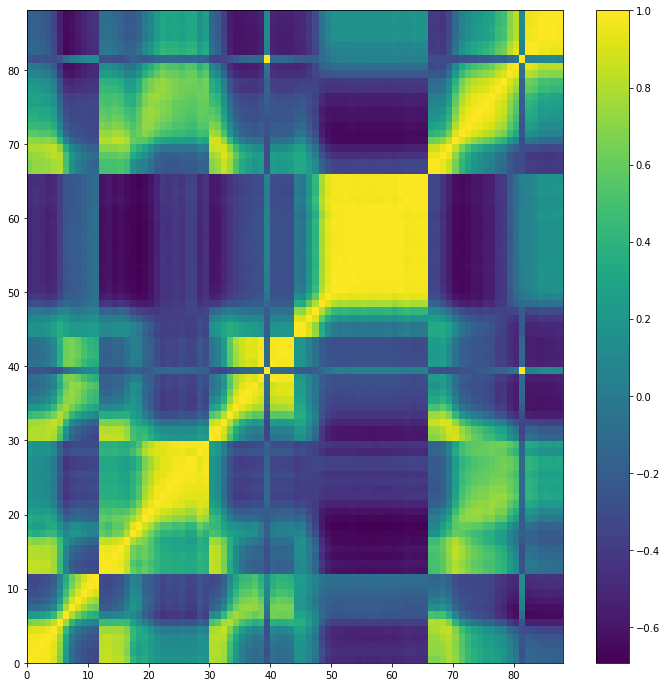

In [39]:
plt.figure(figsize=(12,12))
imgs_c = (imgs - np.mean(imgs,0)).reshape(imgs.shape[0],-1)

plt.pcolor(np.corrcoef(imgs_c))
plt.colorbar()

In [3]:
import PIL
import PIL.Image

def load_subject(s_id):
    subject_dir_set = []
    subject_lbldir_set = []
    dirs_img = glob.glob(f'/data2/artgan/hyperstyle-old/results/new/{s_id}/*')
    for d in dirs_img:
        subject_dir_set.append(os.path.dirname(d))

    X = []

    for d in sorted(dirs_img): 
        print(d)
        l = sorted(glob.glob(d+'/*/*.jpg'),key=get_key_ck)
        X.append(l)

    return X


/data2/artgan/hyperstyle-old/results/new/S113/001
/data2/artgan/hyperstyle-old/results/new/S113/003
/data2/artgan/hyperstyle-old/results/new/S113/008


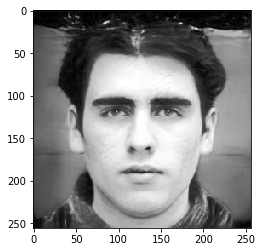

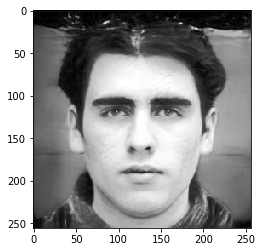

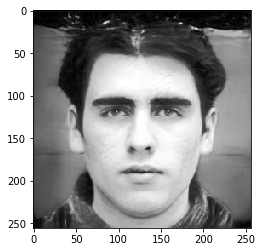

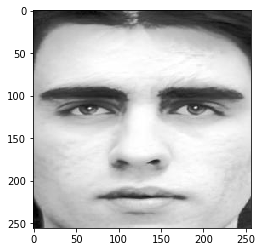

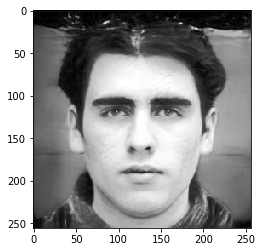

...

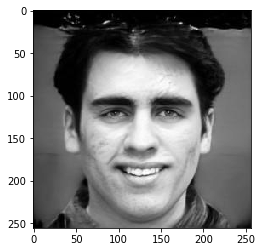

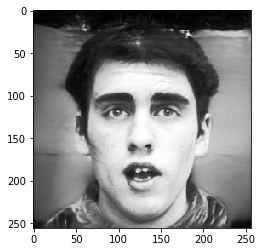

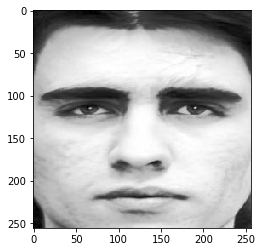

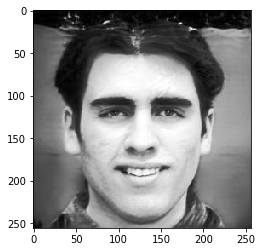

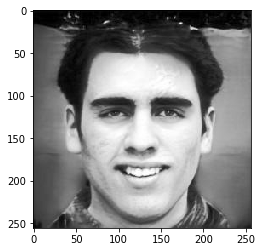

In [4]:
X = load_subject("S113")[0]

tr = transforms.Compose([transforms.Resize((256, 256)),
                         transforms.Grayscale(),transforms.ToTensor()])
train_imgs = []
for j, frame in enumerate(X):
    
    input_image = PIL.Image.open(frame).convert('RGB')
    #plt.imshow(img, interpolation='nearest',cmap='gray')
    #plt.show()
    #input_image = run_alignment(frame,256)
    #input_image = ImageOps.equalize(input_image, mask=None)
    transformed_image = tr(input_image)
    np_img = ((np.asarray(transformed_image)))[0]
    train_imgs.append(np_img)
    plt.imshow(np_img, interpolation='nearest',cmap='gray')
    plt.show()

train_imgs = np.array(train_imgs)

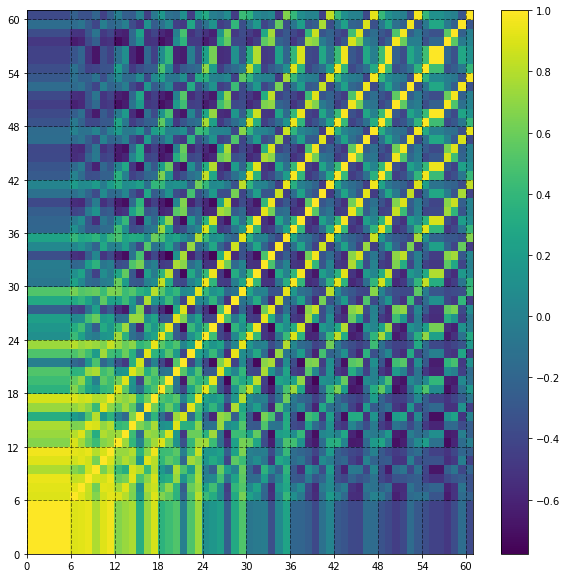

In [12]:
# Usando todas las emociones
plt.figure(figsize=(10,10))
imgs_c = (train_imgs - np.mean(train_imgs,0)).reshape(train_imgs.shape[0],-1)

plt.pcolor(np.corrcoef(imgs_c))
plt.colorbar()

plt.grid(True, linewidth=1, color='black', linestyle='--', alpha=0.5)
plt.xticks(np.arange(0, imgs_c.shape[0] + 1, 6), np.arange(0, imgs_c.shape[0] + 1, 6))
plt.yticks(np.arange(0, imgs_c.shape[0] + 1, 6), np.arange(0, imgs_c.shape[0] + 1, 6))


plt.show()

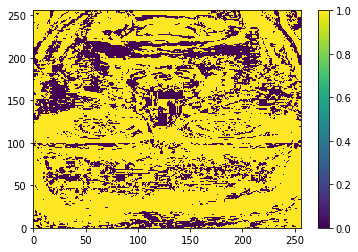

In [32]:
x = train_imgs - np.mean(train_imgs,0)
xs = x[[25,27]]

plt.pcolor(xs[0]*xs[1]<0)
plt.colorbar()

In [30]:
np.sum((xs[0]*xs[1]) > 0) 


18301

In [31]:
np.sum((xs[0]*xs[1])<0) 

47228